## Decision Tree Regressor

### Import the required Libraries

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

## import the Dataset

In [5]:
df = pd.read_csv('/Users/priyankac/Downloads/Air_Quality/Data/Real-Data/Real_Combine.csv')

In [6]:
df.head()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4,219.720833
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1,182.187500
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1,154.037500
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6,223.208333
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2,200.645833


In [7]:
# check the number of rows and columns
df.shape

# There are 1093 rows and 9 features in the dataset

(1093, 9)

In [8]:
# Check basic information about the data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1093 entries, 0 to 1092
Data columns (total 9 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   T       1093 non-null   float64
 1   TM      1093 non-null   float64
 2   Tm      1093 non-null   float64
 3   SLP     1093 non-null   float64
 4   H       1093 non-null   float64
 5   VV      1093 non-null   float64
 6   V       1093 non-null   float64
 7   VM      1093 non-null   float64
 8   PM 2.5  1092 non-null   float64
dtypes: float64(9)
memory usage: 77.0 KB


In [9]:
# Check Basic Statistics about the data
df.describe()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
count,1093.000000,1093.000000,1093.000000,1093.000000,1093.000000,1093.000000,1093.000000,1093.000000,1092.000000
mean,26.009241,32.482251,19.460201,1008.081885,62.918573,2.003111,6.751510,15.805124,109.090984
std,7.237401,6.679078,7.438653,7.529237,15.709816,0.747541,3.841137,7.308435,84.465790
min,6.700000,9.800000,0.000000,991.500000,20.000000,0.300000,0.400000,1.900000,0.000000
25%,19.300000,27.800000,12.100000,1001.100000,54.000000,1.600000,3.700000,11.100000,41.833333
50%,28.200000,34.200000,21.200000,1008.100000,64.000000,1.900000,6.500000,14.800000,83.458333
75%,31.700000,37.000000,26.000000,1015.000000,74.000000,2.600000,9.100000,18.300000,158.291667
max,38.500000,45.500000,32.700000,1023.200000,98.000000,5.800000,24.400000,57.600000,404.500000


## Data Pre processing

In [10]:
# Check for missing values
df.isnull().sum()

# There is 1 missing value in PM 2.5

T         0
TM        0
Tm        0
SLP       0
H         0
VV        0
V         0
VM        0
PM 2.5    1
dtype: int64

In [11]:
# Dropping the records with missing value
df = df.dropna()

## EDA

/Users/priyankac/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

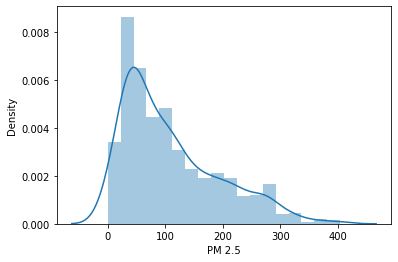

In [12]:
# Univariate Analysis
sns.distplot(df['PM 2.5'])

# Data seems to be right skewed

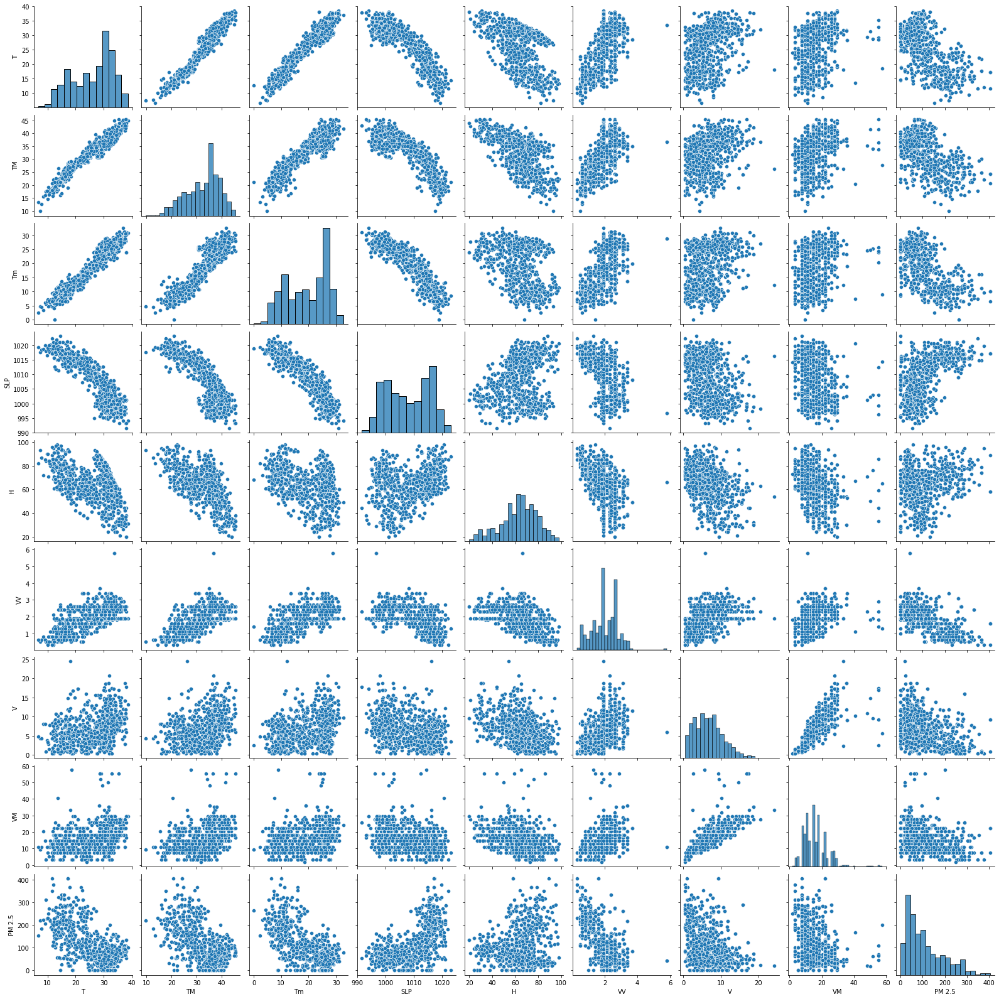

In [13]:
# Multivariate analysis
sns.pairplot(df)

In [14]:
# Checking Correlation
df.corr()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
T,1.000000,0.967536,0.953719,-0.881409,-0.509299,0.640792,0.301994,0.287738,-0.631462
TM,0.967536,1.000000,0.892031,-0.822958,-0.586681,0.606945,0.292949,0.297011,-0.568409
Tm,0.953719,0.892031,1.000000,-0.917518,-0.287357,0.577240,0.296225,0.266782,-0.673824
SLP,-0.881409,-0.822958,-0.917518,1.000000,0.240256,-0.517915,-0.329838,-0.310704,0.623187
H,-0.509299,-0.586681,-0.287357,0.240256,1.000000,-0.465374,-0.380575,-0.362177,0.138005
VV,0.640792,0.606945,0.577240,-0.517915,-0.465374,1.000000,0.376873,0.342442,-0.573941
V,0.301994,0.292949,0.296225,-0.329838,-0.380575,0.376873,1.000000,0.775655,-0.268530
VM,0.287738,0.297011,0.266782,-0.310704,-0.362177,0.342442,0.775655,1.000000,-0.215854
PM 2.5,-0.631462,-0.568409,-0.673824,0.623187,0.138005,-0.573941,-0.268530,-0.215854,1.000000


<AxesSubplot:>

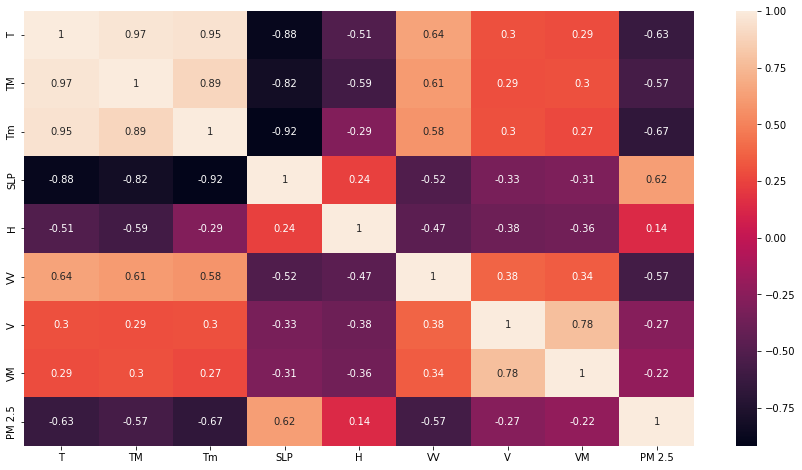

In [15]:
# Bivariate Analysis
plt.figure(figsize = (15,8))
sns.heatmap(df.corr(), annot = True)

In [16]:
# PM 2.5 has negative correlation with T, TM,Tm and VV
# And it has positive correlation with SLP

In [17]:
# Split the independent and Dependent variables
X = df[['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM']] # Independent feature
y = df['PM 2.5'] # Dependent feature

In [18]:
X.head()

,T,TM,Tm,SLP,H,VV,V,VM
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2


In [19]:
y.head()

0    219.720833
1    182.187500
2    154.037500
3    223.208333
4    200.645833
Name: PM 2.5, dtype: float64

### Feature Importances

In [20]:
from sklearn.ensemble import ExtraTreesRegressor

model = ExtraTreesRegressor()
model.fit(X, y)

ExtraTreesRegressor()

In [21]:
print(model.feature_importances_)

[0.21397337 0.09718653 0.19933865 0.12857031 0.08677436 0.17569595
 0.05545063 0.04301021]


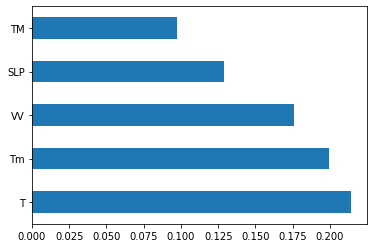

In [22]:
# Plot grapg for better visualization of feature_importances
feat_importances = pd.Series(model.feature_importances_, index = X.columns)
feat_importances.nlargest(5).plot(kind = 'barh')
plt.show()

In [23]:
# From the graph we can see that top 5 features are Tm,VV,T,SLP and H
# we will be using all the features for our model building

## Train Test Split

In [27]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

print('X_train : ', X_train.shape)
print('X_test : ', X_test.shape)
print('y_train : ', y_train.shape)
print('y_test : ', y_test.shape)

X_train :  (873, 8)
X_test :  (219, 8)
y_train :  (873,)
y_test :  (219,)


In [28]:
X_train.head()

,T,TM,Tm,SLP,H,VV,V,VM
681,31.7,37.1,26.0,1003.2,63.0,2.9,1.7,5.4
147,26.6,32.6,21.1,1008.8,76.0,1.6,3.3,11.1
689,29.9,35.0,23.0,1006.3,60.0,2.6,6.7,24.1
778,30.4,37.5,21.6,1006.3,41.0,2.6,12.0,27.8
654,34.1,37.2,29.0,998.4,61.0,2.6,11.5,22.2


In [29]:
 X_test.head()

,T,TM,Tm,SLP,H,VV,V,VM
1034,30.8,35.2,26.8,1005.0,76.0,2.7,3.7,18.3
326,30.7,37.0,24.4,1008.1,57.0,2.7,2.0,14.8
981,36.5,43.0,27.0,1001.8,35.0,2.6,4.1,22.2
32,18.7,27.8,13.3,1016.2,69.0,2.4,7.4,25.9
328,29.6,35.2,24.9,1009.9,59.0,1.9,3.0,20.6


In [30]:
y_train.head()


681    62.375000
147    95.250000
689    41.583333
778    15.166667
654    52.458333
Name: PM 2.5, dtype: float64

In [31]:
y_test.head()

1034     30.666667
326       0.000000
981     128.125000
32        1.833333
328      70.708333
Name: PM 2.5, dtype: float64

## Creating Decision Tree Regressor Model using the training data

In [32]:
from sklearn.tree import DecisionTreeRegressor

In [34]:
dtree = DecisionTreeRegressor(criterion="squared_error")
dtree.fit(X_train, y_train)

DecisionTreeRegressor()

In [36]:
print("Coefficient of determination R^2 <-- on train set: {}".format(dtree.score(X_train, y_train)))


Coefficient of determination R^2 <-- on train set: 1.0


In [37]:
print("Coefficient of determination R^2 <-- on test set: {}".format(dtree.score(X_test, y_test)))


Coefficient of determination R^2 <-- on test set: 0.5480309084291455


In [38]:
# We can see that there is big difference in r2 score between the train and test data,
# which means there is overfitting

In [40]:
from sklearn.model_selection import cross_val_score
score = cross_val_score(dtree, X, y, cv=5)

In [42]:
score.mean()

0.4357150495336818

## Tree Visualization





In [ ]:
from sklearn.tree import plot_tree
plot_rows =1
plot_cols = 1

fig, ax1 = plt.subplots(nrows = plot_rows,ncols=plot_cols,figsize = (20,20))

plot_tree(dtree,ax=ax1,fontsize=10)
plt.show()

## Model Evaluation

In [52]:
prediction = dtree.predict(X_test)

/Users/priyankac/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

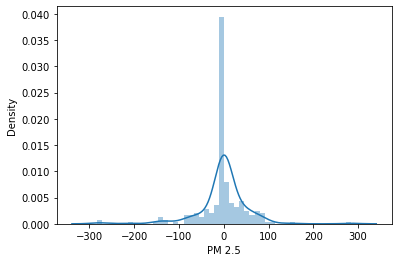

In [53]:
# plot the histogram to check whether the output shows normal distribution
sns.distplot(y_test - prediction)



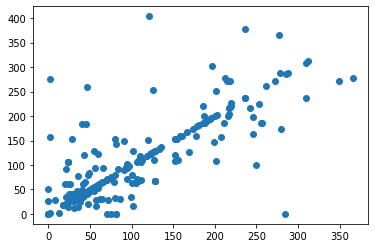

In [54]:
# plot the scatter plot
plt.scatter(y_test, prediction)

# The scatter plot shows linearity

## Hyperparameter tuning for Decision Tree Regressor

In [55]:
# Hyperparameters

params={
 "splitter"    : ["best","random"] ,
 "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15],
 "min_samples_leaf" : [ 1,2,3,4,5 ],
"min_weight_fraction_leaf":[0.1,0.2,0.3,0.4],
 "max_features" : ["auto","log2","sqrt",None ],
    "max_leaf_nodes":[None,10,20,30,40,50,60,70]
}

In [56]:
from sklearn.model_selection import GridSearchCV

In [57]:
gridsearch = GridSearchCV(dtree, param_grid=params, scoring='neg_mean_squared_error', n_jobs=-1, cv=10, verbose=3 )

In [58]:
def timer(start_time=None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec = divmod((datetime.now() - start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec, 60)
        print('\n Time taken: %i hours %i minutes and %s seconds.' % (thour, tmin, round(tsec, 2)))


In [60]:
from datetime import datetime
# Here we go
start_time = timer(None) # timing starts from this point for "start_time" variable
gridsearch.fit(X,y)
timer(start_time) # timing ends here for "start_time" variable

Fitting 10 folds for each of 10240 candidates, totalling 102400 fits
[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-1082.467 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-5077.773 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-3437.834 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-3547.039 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=

[CV 7/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-1740.391 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-3471.770 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-6126.031 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-1847.

[CV 10/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-4316.768 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-5498.530 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-2048.912 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-6242.150 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-5033.661 total time= 

[CV 2/10] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-5622.930 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-2232.867 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-5648.274 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-3949.074 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-3048.750 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-5269.530 total time=

[CV 4/10] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-4007.372 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-4667.156 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-1840.480 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-7263.486 total time

[CV 4/10] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-3142.179 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-2918.858 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-3082.797 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-5725.095 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-1220.015 total time=   0.0s
-5209.945 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-144

[CV 8/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-1234.293 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-5841.725 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-4671.113 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-1976.871 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-5719.456 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-4513.922 total time

[CV 8/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-2322.423 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-3878.831 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-4831.520 total time= 

[CV 6/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-8458.632 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-2057.707 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-6643.321 total ti766.576 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-3494.969 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-4845.

[CV 2/10] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-4742.226 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-1706.912 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-5236.805 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=besal time=   0.0s
[CV 2/10] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-3096.521 total time=   0.0s
[CV 4/10] END max_dept

[CV 1/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-4848.189 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-3915.920 total time

[CV 7/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splittert;, score=-4949.539 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-2572.328 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-3885.344 total time=   0.0s

[CV 1/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-3965.444 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-5423.394 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-2065.845 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-4684.252 total time=

[CV 3/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-2302.833 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-5814.323 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-3489.092 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-2322.423 total time=   0.0s
[CV 

[CV 4/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-3305.853 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-9622.945 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-2201.776 total time

[CV 4/10] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-5948.629 total time=

[CV 10/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-3917.883 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-4655.360 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-1852.556 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-6713.168 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-5315.678 total time= 

[CV 10/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-5792.189 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-2736.379 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-5883.657 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-3124.114 total time=

[CV 1/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 

[CV 6/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-3915.920 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-6054.874 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-1539.217 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-10935.872 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-2870.846 total time=

[CV 4/10] END max_depth=4, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-4614.065 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-3388.168 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-4378.800 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-5108.748 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-10038.451 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-3712.750 tota

[CV 3/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-1863.342 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-5517.381 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-3437.262 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-3409.246 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-6575.067 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-1377.381 total time=

[CV 2/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 

[CV 6/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-4033.795 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-6071.622 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-1297.934 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-7769.450 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-3760.932 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-4364.610 total time= 

[CV 1/10] END max_depth=4, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-4904.967 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-5969.336 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-3124.114 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-4580.777

[CV 1/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-4865.625 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-1923.145 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-5276.047 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-2662.484 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-4284.774 total time=   0.0s
=1, 

[CV 6/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-4304.004 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-4343.337 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-5295.320 total time

[CV 1/10] END max_depth=4, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-1580.155 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-5587.153 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-5506.967 total time

[CV 4/10] END max_depth=4, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-3913.270 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-3649.209 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-1975.589 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-10567.399 total tim

[CV 10/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-3723.506 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-3968.200 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-1815.214 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-8387.607 total time=

[CV 8/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-3899.272 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-3845.707 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-8131.193 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-2048.912 total time=   0

[CV 3/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-2962.436 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-5775.692 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-11406.449 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-4410.054 total time


[CV 9/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-5295.320 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.

[CV 4/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-4656.388 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-3774.335 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-4213.997 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-9530.665 total time

[CV 2/10] END max_depth=4, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-5283.206 total time=

[CV 4/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-5592.334 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-3924.451 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-4287.484 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-11600.343 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-2393.882 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-10935.872 total tim

[CV 2/10] END max_depth=4, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-2710.855 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 

[CV 3/10] END max_depth=4, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 

[CV 8/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-1622.262 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-6368.287 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-4285.388 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.

[CV 3/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-1557.572 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-3990.141 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 

[CV 3/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s[CV 6/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-3496.717 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-4994.157 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-1541.249 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-6865.874 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-3857.003 total time=  

[CV 1/10] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 

[CV 5/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-3406.900 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-4240.988 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-5968.298 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-2172.258 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-5970.068 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-9026.195 total time

[CV 10/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-3876.448 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[

[CV 8/10] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-4725.730 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-1971.355 tota

[CV 10/10] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-4695.042 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-5763.427 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-1644.613 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-5821.157 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-2911.329 total time= 

[CV 9/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-5150.692 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-4525.045 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-3930.229 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-3864.412 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-1952.587 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-5796.257 total time=   

[CV 7/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-5777.620 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-6395.494 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0

[CV 3/10] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-3315.854 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-11399.069 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-4410.054 total time

[CV 4/10] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-6254.716 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-3639.898 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-3814.145 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-5741.044 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-1638.183 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-6673.062 total time=   0.0s
[CV 

[CV 9/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-4645.805 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-5507.955 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-3203.620 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-5636.529 total time=   

[CV 5/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-11374.974 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-4359.024 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-6967.627 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[C

[CV 9/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-6924.463 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-5295.320 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-4736.757 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-4849.072 total time=   0.0s

[CV 4/10] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-3988.850 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-5195.834 total time=

[CV 10/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-2991.669 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_frace, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=

[CV 4/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 

[CV 6/10] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-5123.309 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-6116.702 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-6863.428 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-3867.530 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-4683.550 total time= 

[CV 10/10] END max_depth=6, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-4064.845 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-5060.427 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-2954.855 total time1 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-1945.119 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-6

[CV 6/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-4217.604 total time=   0.0s
[

[CV 3/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-1518.813 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-3988.850 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-5146.808 total time=   0.0s
[

[CV 8/10] END max_depth=6, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-1915.150 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-7624.157 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-2877.142 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-3875.169 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-1518.813 total time=   0.

[CV 8/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-1815.464 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6021.595 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-3758.442 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-4160.148 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-1935.050 tot

[CV 5/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-9292.329 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-8776.778 total tim

[CV 6/10] END max_depth=6, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-5900.360 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-1950.647 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-4683.550 total time=

[CV 7/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-1980.766 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-5295.320 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-5021.374 total time= 

[CV 3/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-2302.833 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-4849.072 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-1815.464 total time=   0.0s
[CV 

[CV 3/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-5814.323 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-3915.920 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-1589.586 total time=

[CV 6/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-3667.115 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-5309.088 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-1722.527 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-5731.021 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-4050.668 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-4062.949 total time=   0.0s
[

[CV 1/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-2869.993 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-5320.212 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-1569.714 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-5283.582 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-2942.962 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-3810.502 total time=   0.0s
[CV 

[CV 6/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-3837.178 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-5265.766 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-1076.076 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-6509.555 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-3292.311 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-4845.983 total time=   0.0s
[

[CV 5/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-2664.780 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-3939.517 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-7153.131 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-1543.550 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-6771.204 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-3752.18

[CV 6/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-3804.963 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-6823.841 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-1213.189 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-6321.695 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-3567.185 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-4845.983 total time=   0.0s
[

[CV 7/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-7503.806 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-1512.018 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-6170.383 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-3974.917 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-4930.880 total time=   

[CV 7/10] END max_depth=6, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-3627.218 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-4569.596 total time=   0.0s

[CV 1/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=al time=   0.0s
[CV 1/10] END max_depth=6, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max

[CV 7/10] END max_depth=8, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-11430.240 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-4519.513 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-2877.142 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-3875.169 

[CV 5/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV

[CV 2/10] END max_depth=8, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-3875.169 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-1518.813 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-3988.850 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 

[CV 3/10] END max_depth=8, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-1826.642 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-4977.250 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-2777.538 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_f[CV 1/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, mi

[CV 6/10] END max_depth=8, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-3590.686 total time=   0.0s[CV 1/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-3880.460 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-4841.299 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-1831.015 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-5685.885 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-3188.327 total time= 

[CV 4/10] END max_depth=8, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-5222.892 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-3584.672 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-3511.007 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-1629.113 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-5948.629 total time=

[CV 4/10] END max_depth=8, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-6820.773 total time=   0.0s
[C

[CV 3/10] END max_depth=8, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s[CV 8/10] END max_depth=8, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-1717.603 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-4679.882 total time=   0.

[CV 3/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-5535.007 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-6144.623 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-5506.434 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-3852.143 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-3808.838 total time= 

[CV 7/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_[CV 3/10] END max_depth=8, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-2302.833 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-5276.047 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=log2, max_leaf_n

[CV 7/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-5230.987 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-1238.758 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-6529.498 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-3764.116 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-4488.887 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-5457.473 total 

[CV 1/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-3927.116 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-4897.374 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-5926.514 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-2648.975 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-4295.206 total time=   0.0s
[CV 

[CV 3/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-2353.856 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-3613.820 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-1722.144 total time

[CV 4/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-6129.567 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-6689.765 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-3881.904 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-6405.549 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-10567.399 total time

[CV 1/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-7431.944 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-8472.321 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-4335.531

[CV 3/10] END max_depth=8, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-5929.355 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-1804.271 total time

[CV 8/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-1430.942 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-6573.274 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-4193.011 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.

[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-10031.575 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-3034.440 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-6002.748 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-3221.492 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-3188.038 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-6277.168 total time

[CV 8/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-2412.664 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-8282.748 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-4164.093 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-2877.142 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-3875.169 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-1518.813 total time=   0.

[CV 10/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-4655.083 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-5103.046 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-2218.804 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-4850.749 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-4508.931 total time= 

[CV 8/10] END max_depth=10, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-4124.914 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-4931.936 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-1790.80

[CV 8/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-4646.255 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-2286.698 total tim

[CV 9/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-7133.478 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-4166.163 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-4158.349 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-4619.701 total t

[CV 9/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-4193.073 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-5700.912 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-3579.066 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-5414.576 total ti

[CV 3/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-1683.984 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-5099.781 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-5835.948 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-4410.054 total

[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-5268.327 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-2610.212 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-3517.382 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-6094.939 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-1298.772 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-6631.995 total

[CV 2/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-5780.590 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-5286.867 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-4003.111 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-3885.683 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-5326.296 total

[CV 10/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-3494.969 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-5818.268 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-8166.732 total

[CV 9/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-6339.985 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-3931.802 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-4194.936 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-5322.749 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-1643.591 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-3323.353 total ti

[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-4473.873 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-4559.333 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-5888.267 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-4411.188 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-10567.399 tota

[CV 10/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-6048.095 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-4771.746 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-5633.678 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-1861.862 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-5257.237 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-2644.267 total time=   

[CV 3/10] END max_depth=10, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-1833.578 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-5256.331 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-2500.566 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-3329.609 total time=   0.00s
[CV 1/10] END max_depth=10, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-3916.073 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-4353.256 total time= 

[CV 7/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-4944.544 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-1213.620 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-5900.963 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-3941.518 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-5731.047 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-10300.061 total time=

[CV 3/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-1836.547 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-3437.670 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-6949.654 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-5507.992 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-1714.407 total

[CV 1/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-3905.348 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-5559.486 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-1921.320 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-6393.597 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-2534.872 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-3843.522 total time=   0.0

[CV 6/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-4845.983 to

[CV 5/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-3513.100 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-4188.997 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-6910.347 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-4455.704 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-11028.489 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-

[CV 10/10] END max_depth=10, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-3242.430 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-2710.855 total time=   

[CV 5/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.

[CV 5/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.

[CV 4/10] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-3988.850 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-6718.744 total t

[CV 5/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-2877.142 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-3875.169 total time=   0.0

[CV 8/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-3758.039 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-5507.190 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-2213.063 total time

[CV 4/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-6142.526 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-4331.410 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-6047.120 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-4288.400 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-10567.399 tota

[CV 2/10] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0

[CV 8/10] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-5228.291 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-10018.421 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-2727.203 total tim

[CV 7/10] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-6954.603 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-4240.635 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-5962.799 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8294

[CV 8/10] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-7929.125 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-2994.079 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-4908.895 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-1637.889 total time

[CV 8/10] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-1469.432 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-3570.681 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-3931.679 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-5761.588 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-1835.672 total time

[CV 8/10] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-1980.766 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-8879.644 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-6969.058 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-4609.978 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-4865.625 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-1861.862 total time

[CV 8/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-3557.951 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6956.343 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-4709.528 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-5403.180 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-3174.436 total time

[CV 7/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-7181.825 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-1453.941 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-6845.427 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-4479.147 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-10300.061 total time=

[CV 2/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-4075.909 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-6132.002 tota

[CV 4/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-3228.859 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-3717.954 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-3314.182 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-7897.801 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-1577.895 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-6851.155 total time=   0.0

[CV 4/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-5883.951 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-10567.399 tota

[CV 5/10] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-4323.105 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-4057.622 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-5860.759 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-2034.635 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-5973.811 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-5588.939 tota

[CV 3/10] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-1518.813 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-3988.850 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0

[CV 3/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-4937.331 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-2171.497 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-4849.072 total tim

[CV 6/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-6012.470 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-6614.695 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-1558.882 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-7135.749 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-3296.887 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-4450.169 total 

[CV 10/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-4851.981 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-5029.307 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-1968.769 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-6064.074 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-8597.478 total 

[CV 10/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-2696.696 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-5094.467 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-1782.927 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-6231.739 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-2409.658 total 

[CV 1/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0

[CV 9/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-5631.213 total ti

[CV 9/10] END max_depth=15, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-4960.653 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-3117.677 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-6175.420 total t

[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-3908.077 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-2710.855 total time=   

[CV 10/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-5728.830 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-4081.084 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-5650.518 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-1698.559 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-6808.408 total 

[CV 3/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_le.062 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-5821.715 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-2049.282 total time=   0.0s
[CV 9/10] END max_depth=15, m

[CV 10/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-3353.305 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-3773.394 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-1753.520 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-4023.168 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-3765.814 total time=   

[CV 4/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-6020.732 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-1681.853 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-7525.529 total

[CV 6/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-3885.683 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-5565.470 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-2322.423 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-1823.445 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-8387.607 total time=

[CV 7/10] END max_depth=15, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-6105.302 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-2084.565 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-5916.276 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=log2, max_leaf_nodes=70, min_samples_0.0s
[CV 4/10] END max_depth=15, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-5276.047 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-5476.205 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=log2, max_leaf_nodes=60, min_samples_lea

[CV 2/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-9794.028 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-8374.111 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-4710.608 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-10979.916 tota

[CV 10/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-5100.114 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-5024.552 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-2006.860 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-3615.808 total

[CV 7/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-11228.752 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-4384.005 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-6380.684 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-8591.639 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-4771.746 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-5463.049 total t

[CV 2/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-3919.343 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-10979.916 tot

[CV 10/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-3396.784 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-2710.855 total time=   

[CV 4/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-5363.932 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-3678.510 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-4855.931 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-7273.507 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-1811.437 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-6910.914 total

[CV 3/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-2710.855 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0

[CV 10/10] END max_depth=15, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-3784.875 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction[CV 4/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=None, max_leaf_

In [61]:
print(gridsearch.best_params_)

{'max_depth': 5, 'max_features': 'auto', 'max_leaf_nodes': None, 'min_samples_leaf': 1, 'min_weight_fraction_leaf': 0.1, 'splitter': 'best'}


In [62]:
print(gridsearch.best_score_)

-3131.648961917888


In [63]:
# Evaluate this model after hyperparameter tuning
prediction = gridsearch.predict(X_test)

/Users/priyankac/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

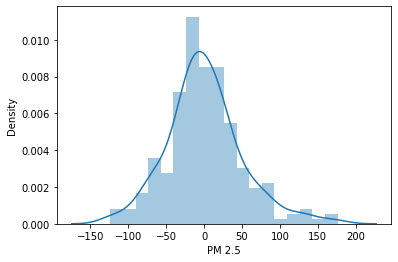

[CV 7/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-6160.565 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-1741.978 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-6627.481 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-3686.367 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-7555.147 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-3225.374 tota

[CV 6/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-3346.442 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-2710.855 total time=   0

[CV 10/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-3297.455 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-4899.244 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-1579.032 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-5840.134 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-2387.464 total 

[CV 7/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-1766.898 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-3872.763 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-3867.441 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-3463.252 total tim

In [64]:
# Plot the distribution
sns.distplot(y_test - prediction)

# Here we see a normally dsitributed graph

In [67]:
from sklearn import metrics

In [68]:
print('MAE : ', metrics.mean_absolute_error(y_test, prediction))
print('MSE : ', metrics.mean_squared_error(y_test, prediction))
print('RMAE : ', np.sqrt(metrics.mean_squared_error(y_test, prediction)))

MAE :  36.913233480127886
MSE :  2469.061343635536
RMAE :  49.6896502667863


## Storing the model

In [69]:
import pickle

In [71]:
# Create a file to store the model
file = open('decisiontree_airquality.pkl', 'wb')

# Store the data in this file
pickle.dump(gridsearch, file)